# Librerias 

In [1]:
import numpy as np 
import pandas as pd 
import sklearn
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, Conv2D, Flatten, Dense, Lambda, Conv2DTranspose, Reshape, BatchNormalization, Dropout
from keras.metrics import categorical_accuracy
from tensorflow.keras.losses import Loss
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from tqdm import tqdm
from tensorflow.keras import layers, regularizers
from tensorflow.keras.utils import plot_model
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import confusion_matrix
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

2024-08-12 05:18:25.282251: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-12 05:18:25.282375: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-12 05:18:25.427945: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# Base de datos

In [2]:
(X_train_full, y_train_full), (X_test, y_test) = keras.datasets.fashion_mnist.load_data()
X_train_full = X_train_full.astype(np.float32) / 255
X_test = X_test.astype(np.float32) / 255
X_train, X_valid = X_train_full[:-5000], X_train_full[-5000:]
y_train, y_valid = y_train_full[:-5000], y_train_full[-5000:]

29515/29515 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
26421880/26421880 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
5148/5148 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
4422102/4422102 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


# Modelo

la **GAN (Generative Adversarial Network)** es una red neuronal diseñada para generar datos nuevos y similares a los datos de entrenamiento. 

Esta compuesta por: 

* Generador (Generator): Su tarea es generar datos falsos que se asemejen a los datos reales. Comienza con una entrada de ruido aleatorio y produce datos (como imágenes, texto, audio, etc.) que intentan imitar los datos reales del conjunto de entrenamiento.

* Discriminador (Discriminator): Su tarea es distinguir entre los datos reales del conjunto de entrenamiento y los datos falsos generados por el generador. Recibe como entrada tanto datos reales como generados y produce una probabilidad de que cada entrada sea real.

In [3]:
tf.random.set_seed(42)
np.random.seed(42)

codings_size = 30

generator = keras.models.Sequential([
    keras.layers.InputLayer(shape=[codings_size]),
    keras.layers.Dense(7 * 7 * 128),
    keras.layers.Reshape([7, 7, 128]),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding='same',
                                 activation="selu"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(1, kernel_size=5, strides=2, padding='same',
                                 activation="tanh"),
])
discriminator = keras.models.Sequential([
    keras.layers.InputLayer(shape=[28, 28, 1]),
    keras.layers.Conv2D(64, kernel_size=5, strides=2, padding='same',
                        activation=keras.layers.LeakyReLU(0.2)),
    keras.layers.Dropout(0.4),
    keras.layers.Conv2D(128, kernel_size=5, strides=2, padding='same',
                        activation=keras.layers.LeakyReLU(0.2)),
    keras.layers.Dropout(0.4),
    keras.layers.Flatten(),
    keras.layers.Dense(1, activation="sigmoid")
])
gan = keras.models.Sequential([generator, discriminator])

# Generador

Para el modelo se utlizo el coding_size que el tamaño del espacio latente (el vector de entrada de ruido aleatorio) que será utilizado para generar nuevas imágenes, en este caso de 30.
el tamaño del kernel en la capa Conv2DTranspose es de 5x5 y los strides de 2 el filtro se mueve dos píxeles a la vez, cubriendo menos posiciones en la matriz de entrada, lo que resulta en una salida más pequeña (en el caso de convoluciones regulares) o una salida más grande (en el caso de convoluciones transpuestas). La activación que utilice es la "selu" esta nos permite la auto-normalización. y el padding en same(el padding se refiere a la adición de píxeles alrededor de los bordes de la imagen de entrada antes de aplicar la operación convolucional, añadiendo 0s a los bordes.) 

# Discriminador

para el discriminador se utilizó una activación Leaky ReLU con $\alpha = 0.2$

* Si $x > 0$, $\text{LeakyReLU}(x) = x$ (igual que ReLU)
* Si $x \leq 0$, $\text{LeakyReLU}(x) = 0.2 \cdot x$.


Esto significa que las entradas negativas no se aplastan a cero, sino que se multiplican por un factor de 0.2, permitiendo un pequeño gradiente negativo.

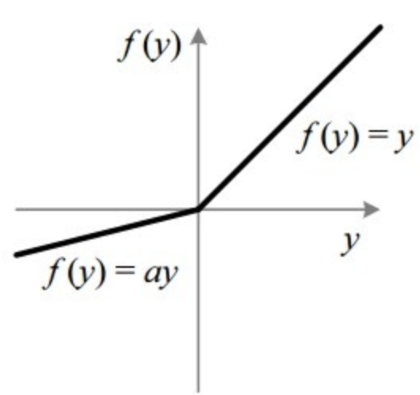

y tambien se utilizó la activación sigmoide: 




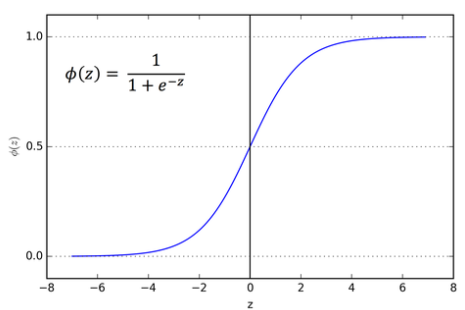

* Rango de salida: La salida está siempre en el rango $(0, 1)$.
* Simetría: La función es simétrica respecto al origen.
* Asintótica: A medida que $x$ tiende a $+\infty$, $\sigma(x)$ tiende a 1, y a medida que $x$ tiende a $-\infty$, $\sigma(x)$ tiende a 0.

In [4]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop", metrics=['accuracy'])
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

El optimizador RMSprop se basa en la adaptación de la tasa de aprendizaje para cada uno de los parámetros del modelo. Al igual que Adagrad, RMSprop ajusta la tasa de aprendizaje para cada parámetro, pero a diferencia de Adagrad, RMSprop mantiene una tasa de aprendizaje eficiente para grandes conjuntos de datos y problemas no estacionarios.

 $g_t = \nabla_{\theta} J(\theta) $
$E[g^2]_t = \gamma E[g^2]_{t-1} + (1 - \gamma) g_t^2 $
 $\theta_{t+1} = \theta_t - \frac{\eta}{\sqrt{E[g^2]_t + \epsilon}} g_t$
 
 Donde:

*  $g_t$ es el gradiente del costo con respecto a los parámetros en el tiempo $t$.
*  $E[g^2]_t$ es el promedio móvil exponencial de los cuadrados de los gradientes.
*  $\gamma$ es el factor de decaimiento (generalmente se establece en 0.9).
* $\eta$ es la tasa de aprendizaje.
* $\epsilon$ es un término pequeño para evitar divisiones por cero (generalmente se establece en $10^{-8}$).
* $\theta_t$ son los parámetros en el tiempo $t$.


In [5]:
X_train_dcgan = X_train.reshape(-1, 28, 28, 1) * 2. - 1. # reshape and rescale

In [6]:
batch_size = 256 #Define el tamaño de los lotes (batches) que se usarán durante el entrenamiento. En este caso, cada lote tendrá 256 ejemplos.
dataset = tf.data.Dataset.from_tensor_slices(X_train_dcgan)#es un tensor o un array que contiene los datos de entrenamiento.
dataset = dataset.shuffle(1000) #Mezcla (shuffle) los datos del dataset de manera aleatoria.
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1) #asegura que solo se usen lotes completos. Si el tamaño del dataset no es divisible exactamente por batch_size, se descartarán los ejemplos restantes que no completen un lote.

Eata función me permite observar como la GAN atraves de las epocas va mejorando, comparando las imagenes generadas, con las imagenes originales.
Y en las imagenes se puede observar que atraves de las epocas el modelo si aprende a generar imagenes cada vez más parecidas a las originales. 

Epoch 1/10
1/1

I0000 00:00:1723439927.074470      76 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1723439933.393402      75 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


214/1

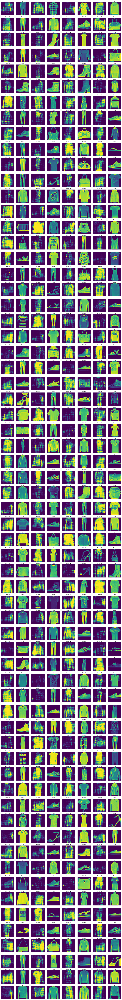

Epoch 2/10
214/1

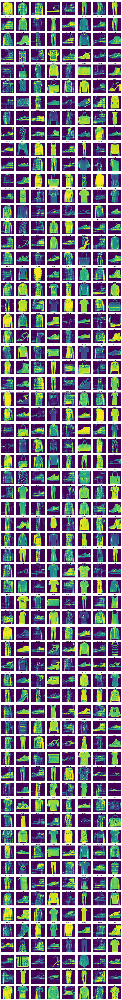

Epoch 3/10
214/1

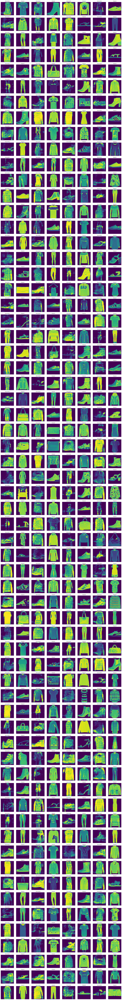

Epoch 4/10
214/1

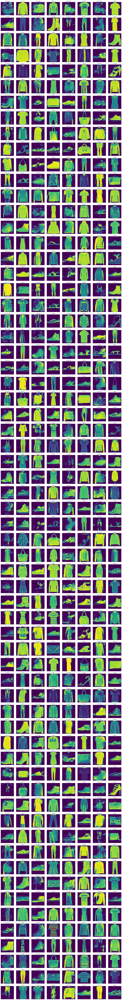

Epoch 5/10
214/1

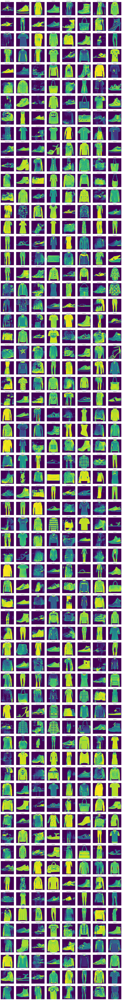

Epoch 6/10
214/1

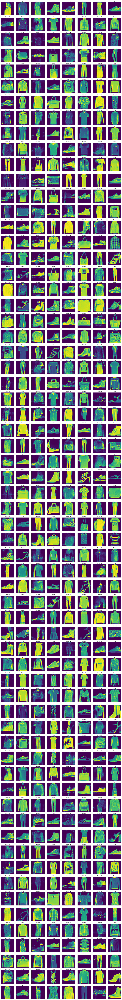

Epoch 7/10
214/1

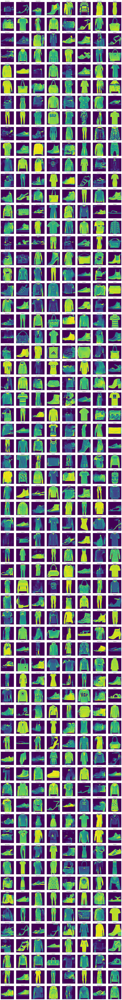

Epoch 8/10
214/1

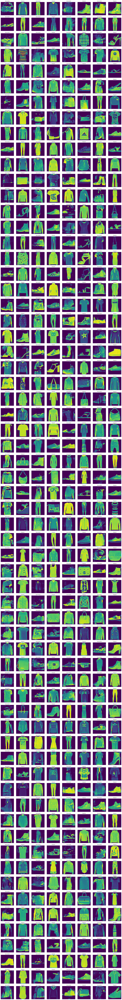

Epoch 9/10
214/1

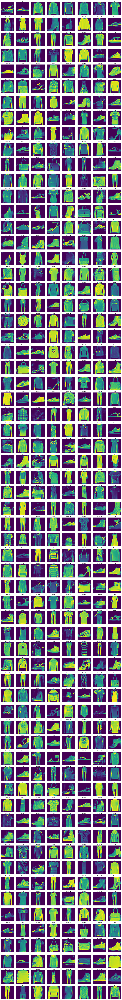

Epoch 10/10
214/1

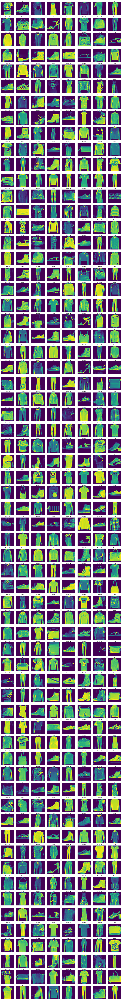

In [7]:
def plot_multiple_images(generated_images, original_images, n_cols=8):
    n_images = len(generated_images)
    n_rows = (n_images * 2) // n_cols + ((n_images * 2) % n_cols != 0)
    
    plt.figure(figsize=(n_cols * 2, n_rows * 2))
    
    for i in range(n_images):
        # Plot generated images
        plt.subplot(n_rows, n_cols, 2 * i + 1)
        plt.imshow(generated_images[i], cmap='viridis')
        plt.title("Generated", fontsize=8)
        plt.axis("off")
        
        # Plot original images
        plt.subplot(n_rows, n_cols, 2 * i + 2)
        plt.imshow(original_images[i], cmap='viridis')
        plt.title("Original", fontsize=8)
        plt.axis("off")
    
    plt.tight_layout()
    plt.show()

def train_gan(gan, dataset, batch_size, codings_size, n_epochs=5):
    generator, discriminator = gan.layers
    for epoch in range(n_epochs):
        print("Epoch {}/{}".format(epoch + 1, n_epochs))
        for i_, X_batch in enumerate(dataset):
            print(f'\r{i_+1}/{round(len(dataset) / batch_size)}', end='')
            # phase 1 - training the discriminator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            generated_images = generator(noise)
            X_fake_and_real = tf.concat([generated_images, X_batch], axis=0)
            y1 = tf.constant([[0.]] * batch_size + [[1.]] * batch_size)
            discriminator.trainable = True
            discriminator.train_on_batch(X_fake_and_real, y1)
            # phase 2 - training the generator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            y2 = tf.constant([[1.]] * batch_size)
            discriminator.trainable = False
            gan.train_on_batch(noise, y2)
        
        # Visualización de las imágenes generadas y originales
        plot_multiple_images(generated_images.numpy(), X_batch.numpy(), n_cols=8)

# Ejemplo de cómo llamar a la función train_gan
train_gan(gan, dataset, batch_size, codings_size, n_epochs=10)

# Estructura del generador

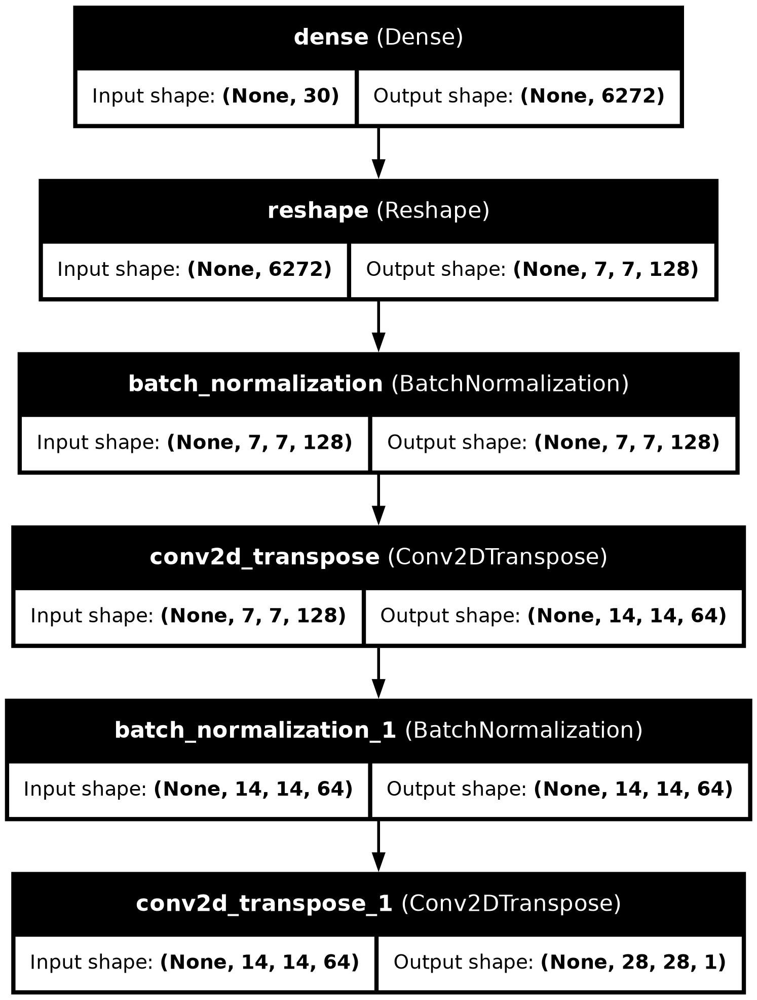

In [8]:
plot_model(generator, to_file='generator_model.png', show_shapes=True, show_layer_names=True)

# Arquitectura del discriminador 

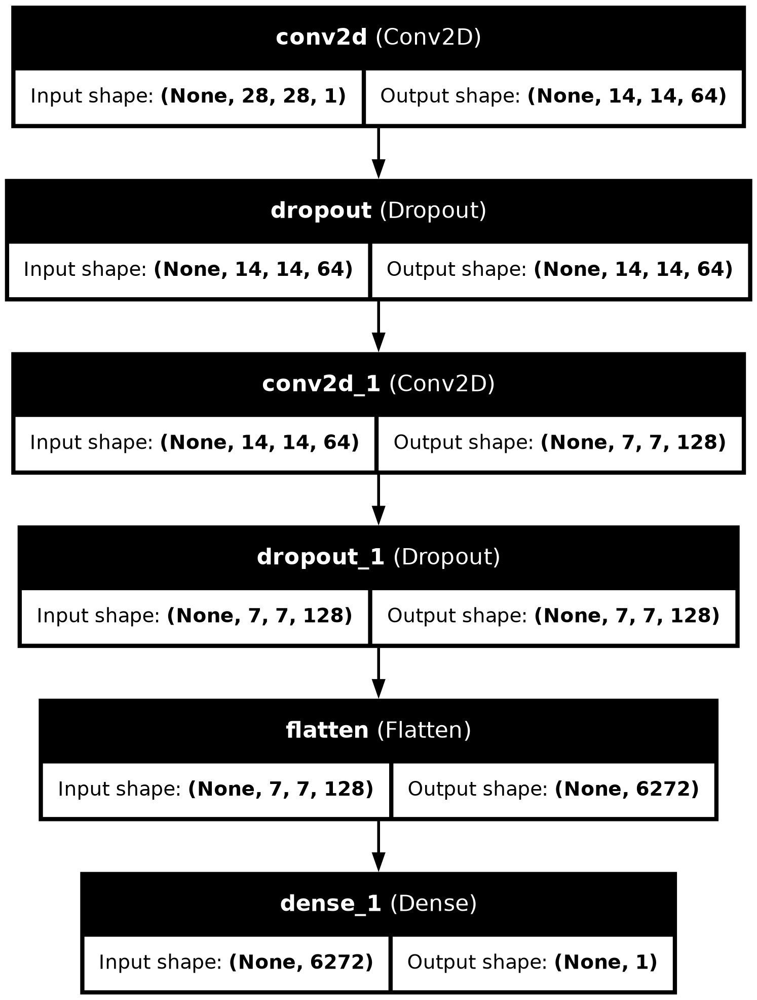

In [9]:
plot_model(discriminator, to_file='discriminator_model.png', show_shapes=True, show_layer_names=True)

# Arquitectura de la GAN 

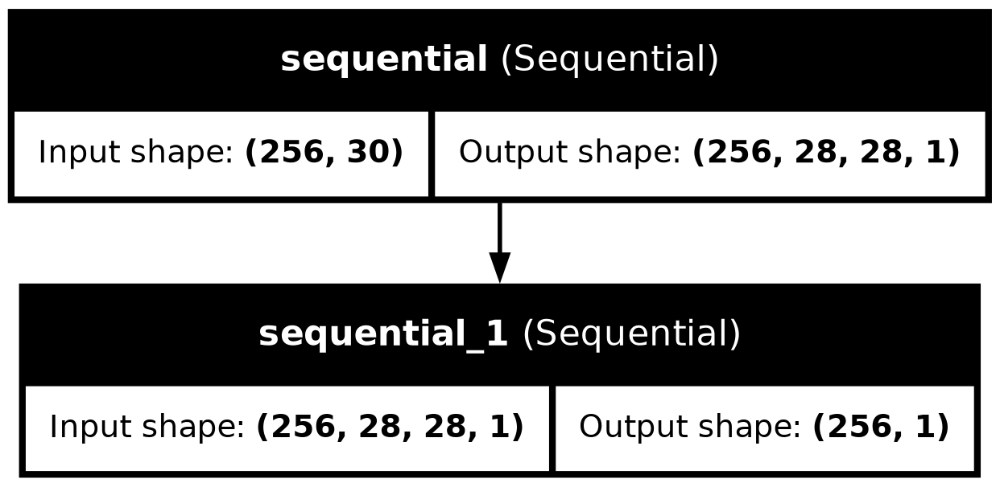

In [10]:
plot_model(gan, to_file='gan_model.png', show_shapes=True, show_layer_names=True)

Después de entrenar la GAN, es importante evaluar cómo de bien el discriminador puede distinguir entre imágenes reales y generadas. La función evaluate_discriminator calcula la pérdida y la precisión del discriminador en un conjunto de datos de prueba que incluye tanto imágenes reales como generadas.

La función plot_roc_curve generará y visualizará la curva ROC (Receiver Operating Characteristic) del discriminador de la GAN. La curva ROC es una herramienta gráfica que se utiliza para evaluar el rendimiento de un clasificador binario, mostrando la relación entre la tasa de verdaderos positivos (True Positive Rate, TPR) y la tasa de falsos positivos (False Positive Rate, FPR) a diferentes umbrales de decisión. También calculará y mostrará el área bajo la curva (AUC), que es una métrica de la capacidad del modelo para distinguir entre las clases.

16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step  


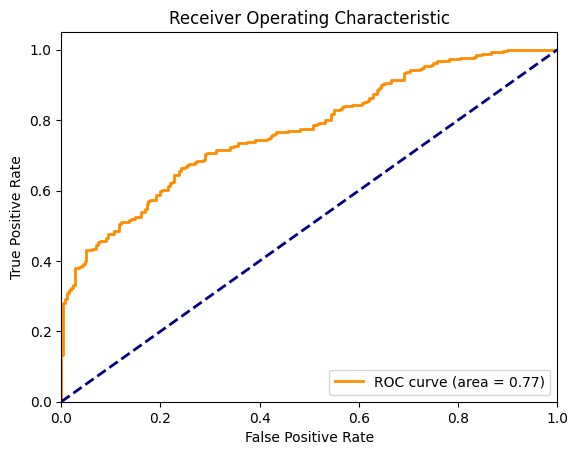

In [11]:
def plot_roc_curve(discriminator, dataset, batch_size, codings_size):
    real_images = next(iter(dataset))
    noise = tf.random.normal(shape=[batch_size, codings_size])
    generated_images = generator(noise)

    X_test = tf.concat([real_images, generated_images], axis=0)
    y_test = tf.concat([tf.ones((batch_size, 1)), tf.zeros((batch_size, 1))], axis=0).numpy()

    y_scores = discriminator.predict(X_test).ravel()

    fpr, tpr, thresholds = roc_curve(y_test, y_scores)
    roc_auc = auc(fpr, tpr)

    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:0.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

# Plotear la curva ROC
plot_roc_curve(discriminator, dataset, batch_size, codings_size)

Accuracy: 0.62
Precision: 1.00
Recall: 0.25
F1-Score: 0.40
False Positive Rate: 0.00
False Negative Rate: 0.75


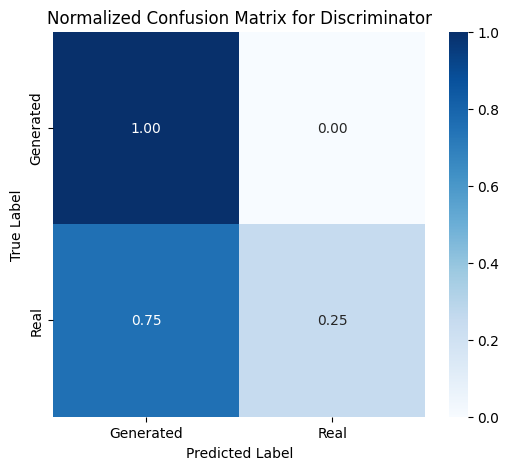

In [12]:
def evaluate_discriminator(generator, discriminator, real_images, n_images=256):
    # Generar imágenes falsas
    noise = tf.random.normal(shape=[n_images, generator.input_shape[1]])
    fake_images = generator(noise, training=False)
    
    # Asegurarse de que n_images no sea mayor que el número de imágenes reales disponibles
    real_images = real_images[:n_images]
    
    # Concatenar las imágenes reales y generadas
    combined_images = tf.concat([fake_images, real_images], axis=0)
    
    # Crear etiquetas verdaderas (0 para falso, 1 para real)
    labels = tf.concat([tf.zeros(n_images), tf.ones(n_images)], axis=0)
    
    # Predecir con el discriminador
    predictions = discriminator(combined_images, training=False)
    predicted_labels = tf.where(predictions < 0.5, 0, 1).numpy().flatten()
    
    # Calcular la matriz de confusión
    cm = confusion_matrix(labels, predicted_labels, normalize='true')
    
    # Calcular las métricas
    accuracy = accuracy_score(labels, predicted_labels)
    precision = precision_score(labels, predicted_labels)
    recall = recall_score(labels, predicted_labels)
    f1 = f1_score(labels, predicted_labels)
    
    # Calcular error entre lo que es falso y lo que es verdadero
    false_positive_rate = cm[0, 1]
    false_negative_rate = cm[1, 0]
    
    # Imprimir las métricas
    print(f"Accuracy: {accuracy:.2f}")
    print(f"Precision: {precision:.2f}")
    print(f"Recall: {recall:.2f}")
    print(f"F1-Score: {f1:.2f}")
    print(f"False Positive Rate: {false_positive_rate:.2f}")
    print(f"False Negative Rate: {false_negative_rate:.2f}")
    
    # Visualizar la matriz de confusión normalizada
    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt='.2f', cmap='Blues', xticklabels=['Generated', 'Real'], yticklabels=['Generated', 'Real'])
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Normalized Confusion Matrix for Discriminator')
    plt.show()

# Ejemplo de cómo llamar a la función
evaluate_discriminator(generator, discriminator, real_images=X_train_dcgan[:300])